In [2]:
featuresX = []
for line in open('./data/features_train/features_resnet1000_train.csv'):
    l = line.strip().split(",")
    featuresX.append(l)

In [4]:
import timeit

In [4]:
for i in range(0,len(featuresX)):
    featuresX[i][0] = featuresX[i][0].split("/")[1].split(".")[0]

In [5]:
import numpy as np
featuresX.sort()
Y = np.array(featuresX)[:,1:len(featuresX[0])]


In [6]:
featuresX_test = []
for line in open('./data/features_test/features_resnet1000_test.csv'):
    l = line.strip().split(",")
    featuresX_test.append(l)
for i in range(0,len(featuresX_test)):
    featuresX_test[i][0] = featuresX_test[i][0].split("/")[1].split(".")[0]

featuresX_test.sort()
Y_test = np.array(featuresX_test)[:,1:len(featuresX_test[0])]


In [1]:
featuresX1 = []
for line in open('./data/features_train/features_resnet1000intermediate_train.csv'):
    l = line.strip().split(",")
    featuresX1.append(l)
for i in range(0,len(featuresX1)):
    featuresX1[i][0] = featuresX1[i][0].split("/")[1].split(".")[0]
import numpy as np
featuresX1.sort()
Y = np.array(featuresX1)[:,1:len(featuresX1[0])]


In [2]:
featuresX1_test = []
for line in open('./data/features_test/features_resnet1000_test.csv'):
    l = line.strip().split(",")
    featuresX1_test.append(l)
for i in range(0,len(featuresX1_test)):
    featuresX1_test[i][0] = featuresX1_test[i][0].split("/")[1].split(".")[0]

featuresX1_test.sort()
Y_test = np.array(featuresX1_test)[:,1:len(featuresX1_test[0])]

In [1]:
from numpy import loadtxt
descAll = []
for i in range(0,10000):
    f = open('./data/descriptions_train/'+ str(i) +'.txt', 'r')
    desc = f.readlines();
    descAll.append(desc)
    

In [2]:
descAllTest = []
for i in range(0,2000):
    f = open('./data/descriptions_test/'+ str(i) +'.txt', 'r')
    descTest = f.readlines();
    descAllTest.append(descTest)
    


In [3]:
from nltk.stem.wordnet import WordNetLemmatizer
import re
from nltk.stem import PorterStemmer
from itertools import chain

In [5]:
def clean_data(sentences):
    lmtzr = PorterStemmer()
    def split_word(strOfWords):
        tempWords  = []
        for word in strOfWords.split():
            word = "".join(x for x in word if x.isalpha())
            word = "".join(lmtzr.stem(word))
            if word.lower():
                 tempWords.append(word)
        return " ".join(tempWords)
    return [[split_word(x) for x in y.split()] for y in sentences]

descAllClean = []
for desc in descAll:
    d=clean_data(desc);
    new_desc = list(chain.from_iterable(d));
    new_desc = " ".join(new_desc);
    descAllClean.append(new_desc);


In [6]:
descAllCleanTest = []
for desc in descAllTest:
    d=clean_data(desc);
    new_desc = list(chain.from_iterable(d));
    new_desc = " ".join(new_desc);
    descAllCleanTest.append(new_desc);


In [7]:
def myTokenizer(text):
    return text.split()
    
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(stop_words="english",lowercase=True,tokenizer=myTokenizer,token_pattern="[A-Za-z]*",strip_accents='ascii',vocabulary=None)
X = cv.fit_transform(descAllClean)


X_test = cv.transform(descAllCleanTest)


In [44]:
print(X.shape)

(10000, 6539)


In [82]:
lmtzr = WordNetLemmatizer()
from numpy import loadtxt
tags = []
for i in range(0,10000):
    f = open('./data/tags_train/'+ str(i) +'.txt', 'r')
    x = f.readlines()
    tempword = []
    for line in x:
        line = line.rstrip('\n')
        line = line.split(':')[1]
        tempword.append(line)
    #testdata = [",".join(tempword)];
    tags.append(tempword);


In [83]:
lmtzr = WordNetLemmatizer()
from numpy import loadtxt
tagsTest = []
for i in range(0,2000):
    f = open('./data/tags_test/'+ str(i) +'.txt', 'r')
    x = f.readlines()
    tempword = []
    for line in x:
        line = line.rstrip('\n')
        line = line.split(':')[1]
        tempword.append(line)
    #testdata = [",".join(tempword)];
    tagsTest.append(tempword);


In [84]:
tagsClean = []
for tag in tags:
    tag=clean_data(tag);
    new_tag = list(chain.from_iterable(tag));
    new_tag = " ".join(new_tag);
    tagsClean.append(new_tag);
    
tagsCleanTest = []
for tag in tagsTest:
    tag=clean_data(tag);
    new_tag = list(chain.from_iterable(tag));
    new_tag = " ".join(new_tag);
    tagsCleanTest.append(new_tag);
    
print(tagsCleanTest)

['bed backpack suitcas tie', 'cow', 'frisbe person', 'car traffic light truck', 'cat bed', 'bowl broccoli cup', 'fork pizza', 'donut person', 'pot plant bench', 'cat dine tabl book', 'giraff', 'laptop mous book keyboard cell phone', 'person hot dog', 'car person bench laptop truck', 'banana sandwich', 'stop sign', 'person snowboard', 'bu', 'cat bed book', 'bench', 'person skateboard bench', 'cell phone person cup laptop handbag chair', 'cat person book handbag', 'cell phone person carrot dine tabl cup', 'person traffic light bu', 'tie person cup', 'person kite', 'tv chair mous keyboard book vase pot plant laptop', 'person basebal bat', 'dog boat person car truck', 'cell phone bowl', 'person frisbe', 'dog frisbe', 'person ski', 'pot plant tv chair dine tabl refriger', 'cat umbrella', 'person cell phone', 'person frisbe', 'chair vase dine tabl cup', 'bottl toothbrush toilet sink pot plant', 'tv couch chair refriger spoon microwav toaster sink dine tabl', 'bed person book', 'traffic light

In [85]:
import numpy as np
def myTokenizer(text):
    return text.split()
    
from sklearn.feature_extraction.text import CountVectorizer
cv1 = CountVectorizer(binary=True,stop_words="english",lowercase=True,tokenizer=myTokenizer,token_pattern="[A-Za-z]*",strip_accents='ascii',vocabulary=None)
Y_tag = cv1.fit_transform(tagsClean)
x_tags = Y_tag.toarray()
#Y_tag = np.array(Y_tag)
print(Y_tag.toarray().shape)
Y_test_tag = cv1.transform(tagsCleanTest)
x_test_tags = Y_test_tag.toarray()
print(Y_test_tag.shape)

(10000, 91)
(2000, 91)


In [86]:
##RANDOM FOREST REGRESSION
start_time = timeit.default_timer()

from sklearn.ensemble.forest import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=30)
rf.fit(X, x_tags)
outputrf = rf.predict(X_test)

elapsed = timeit.default_timer() - start_time
print('Time Elapsed (min): '+str(elapsed/60))

Time Elapsed (min): 0.9624173364779988


In [20]:
##CROSS_VALIDATION - RANDOM FOREST
from sklearn.model_selection import cross_val_score
scoresRF = cross_val_score(rf, X, Y_tag.toarray(), cv=3)
print("Accuracy: %0.2f (+/- %0.2f)" % (scoresRF.mean(), scoresRF.std() * 2))

Accuracy: 0.54 (+/- 0.01)


In [89]:
from sklearn.metrics.pairwise import cosine_similarity
getImagesRF = cosine_similarity(outputrf,x_test_tags)


In [88]:
def f(a,N):
    return np.argsort(a)[::-1][:N]

758


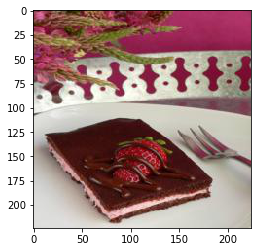

1907


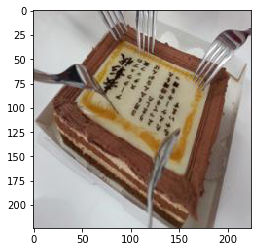

1156


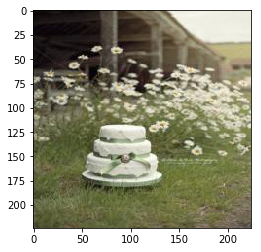

1341


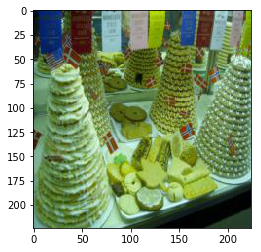

1529


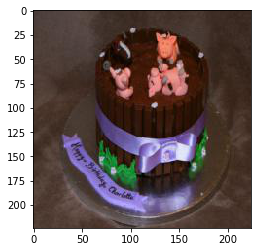

457


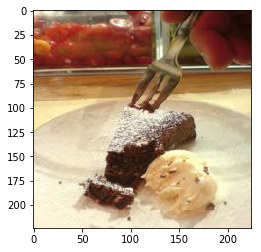

833


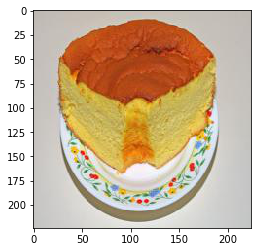

589


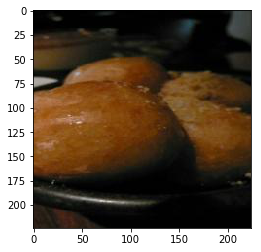

1929


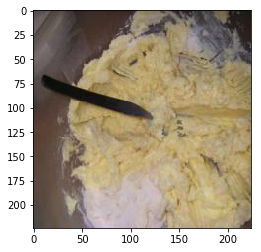

601


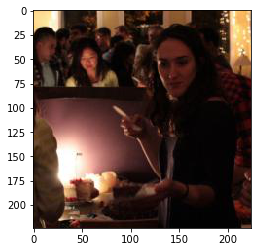

1219


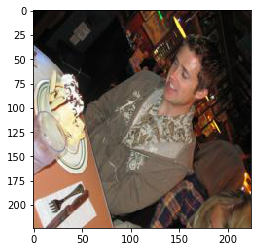

348


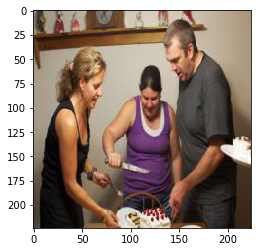

1071


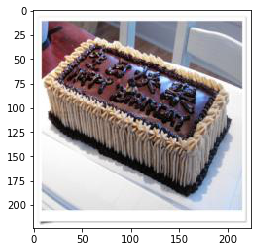

753


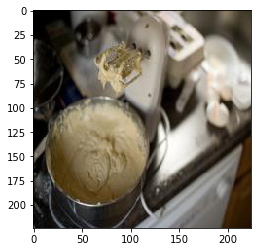

1753


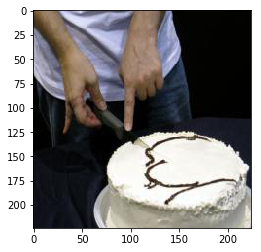

1824


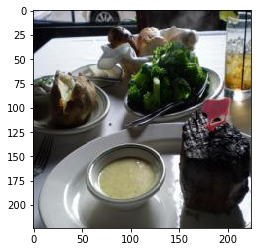

809


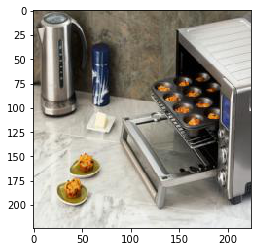

542


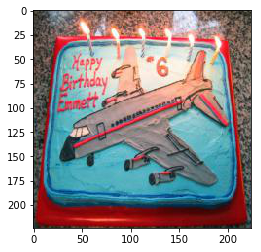

948


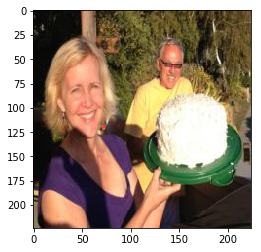

435


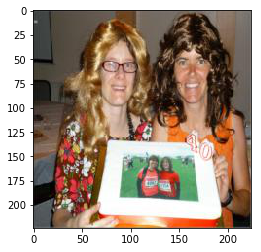

In [90]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
indexImages = f(getImagesRF[1], 20)
#print(indexImages)
for i in indexImages:
    print(str(i))
    img = Image.open('./data/images_test/'+ str(i) +'.jpg')
    img = np.asarray(img)
    plt.imshow(img)
    plt.show()

In [111]:
## KNN REGRESSOR
from sklearn.neighbors import KNeighborsRegressor

knn = KNeighborsRegressor(n_neighbors=10)
knn.fit(X, x_tags)
outputKNN = knn.predict(X_test)

getImagesKNN = cosine_similarity(outputKNN,x_test_tags)

In [11]:
print(Y.shape)

(10000, 2048)


In [92]:
##CROSS VALIDATION KNN REGRESSOR
from sklearn.model_selection import cross_val_score
scoresKNN = cross_val_score(knn, X, x_tags, cv=3)
print("Accuracy: %0.2f (+/- %0.2f)" % (scoresKNN.mean(), scoresKNN.std() * 2))

Accuracy: 0.46 (+/- 0.02)


1907


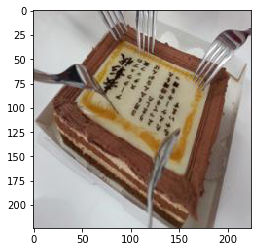

589


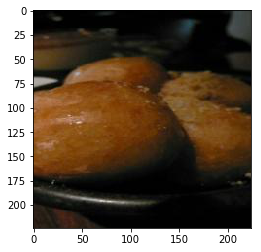

833


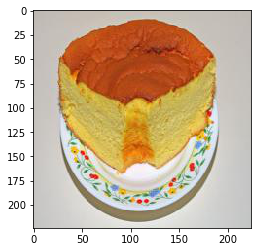

1071


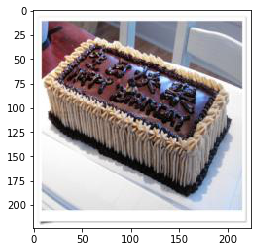

1219


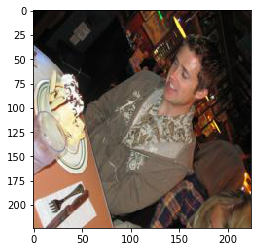

348


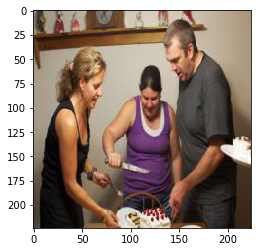

1753


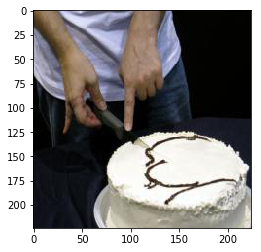

1742


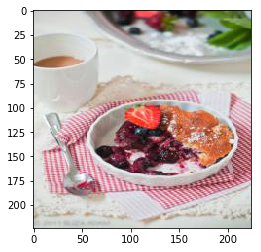

758


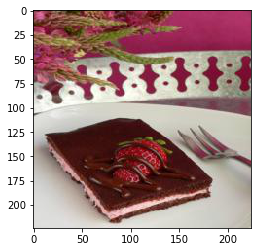

1489


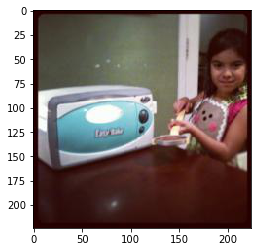

956


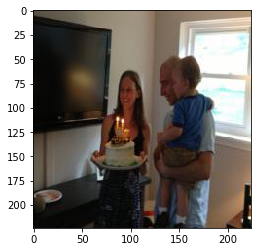

1824


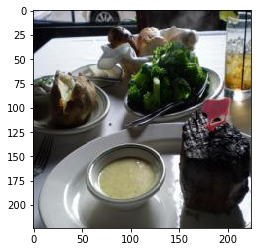

150


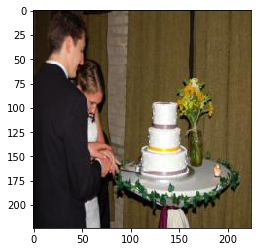

1174


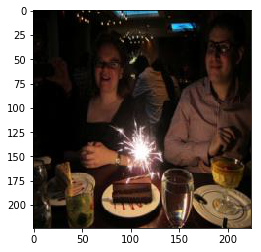

1601


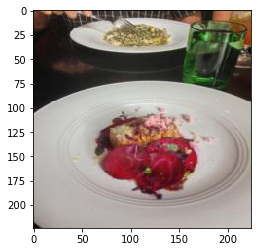

562


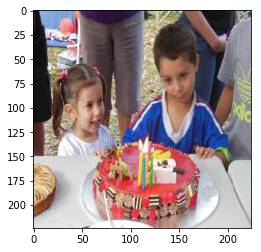

1757


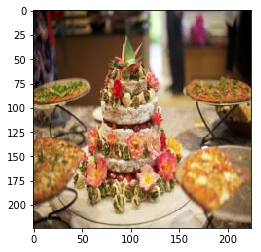

1529


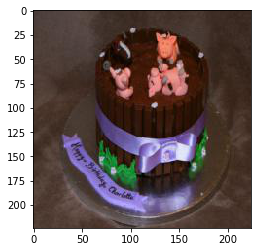

1341


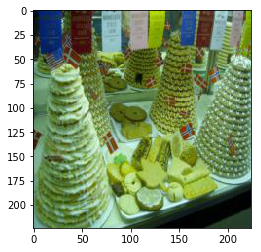

1156


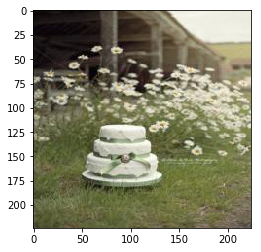

In [112]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
indexImages = f(getImagesKNN[1], 20)
#print indexImages
for i in indexImages:
    print(str(i))
    img = Image.open('./data/images_test/'+ str(i) +'.jpg')
    img = np.asarray(img)
    plt.imshow(img)
    plt.show()

[1907  758  589  833 1529 1341 1156  457 1071 1219  348 1753  601 1489  956
  562 1929 1824  150 1174]
1907


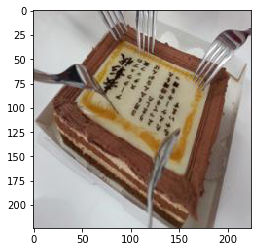

758


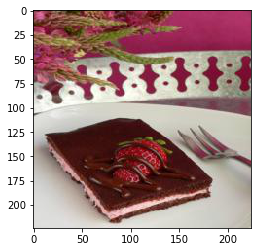

589


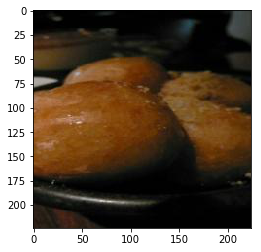

833


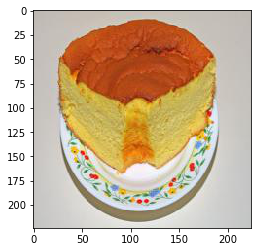

1529


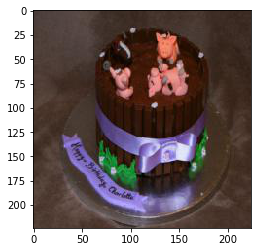

1341


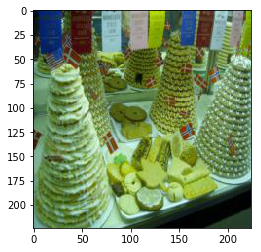

1156


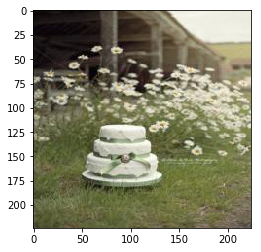

457


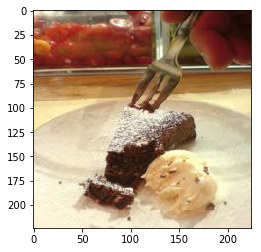

1071


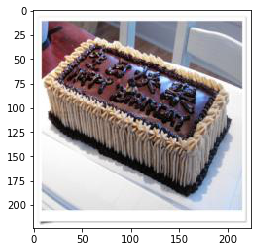

1219


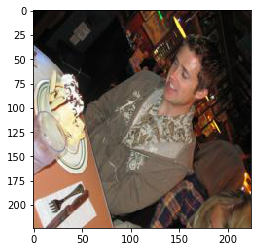

348


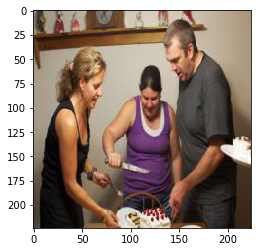

1753


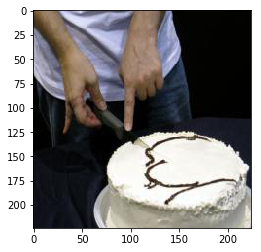

601


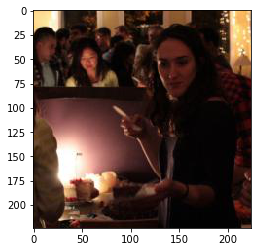

1489


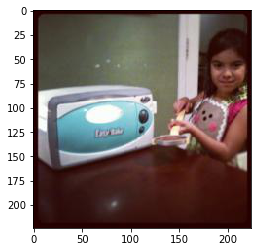

956


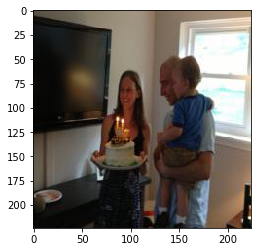

562


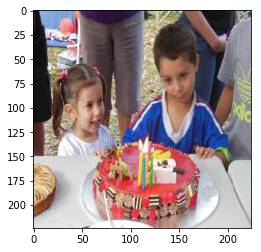

1929


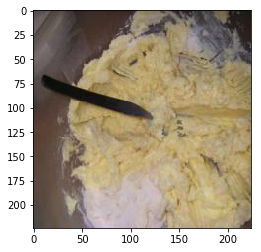

1824


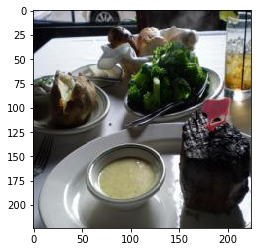

150


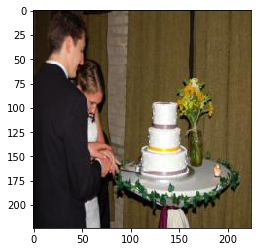

1174


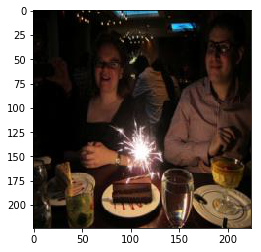

In [60]:
mean = (outputrf+outputKNN)/2
getImagesMean = cosine_similarity(mean,x_test_tags)
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
indexImages = f(getImagesMean[1], 20)
print indexImages
for i in indexImages:
    print(str(i))
    img = Image.open('./images_test/'+ str(i) +'.jpg')
    img = np.asarray(img)
    #plt.imshow(img)
    #plt.show()

In [94]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC

start_time = timeit.default_timer()
classif = OneVsRestClassifier(SVC(kernel='linear'))
classif.fit(X, x_tags)
svmOutput = classif.predict(X_test)
getImagesSVM = cosine_similarity(svmOutput,x_test_tags)
elapsed = timeit.default_timer() - start_time
print('Time Elapsed (min): '+str(elapsed/60))

Time Elapsed (min): 4.4655920747366205


In [43]:
## CROSS VALIDATION - SVM 
from sklearn.model_selection import cross_val_score
scoresSVM = cross_val_score(classif, X, x_tags, cv=3)
print("Accuracy: %0.2f (+/- %0.2f)" % (scoresSVM.mean(), scoresSVM.std() * 2))

Accuracy: 0.25 (+/- 0.02)


1907


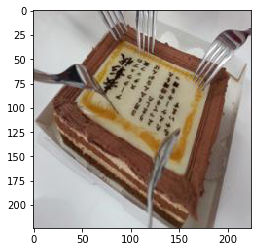

589


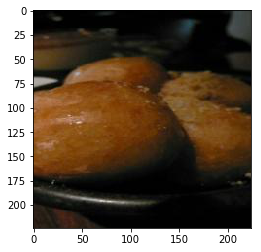

833


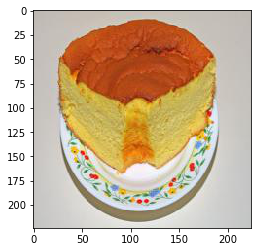

1071


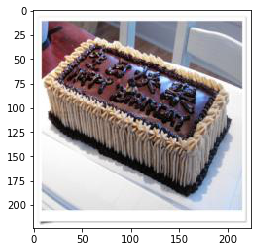

314


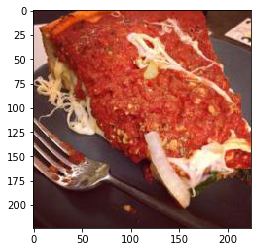

348


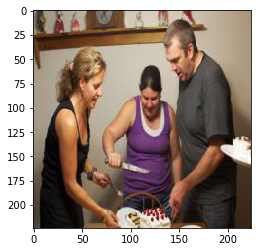

1219


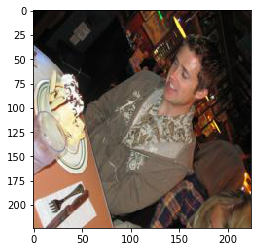

758


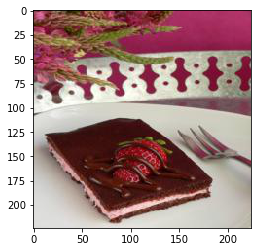

1049


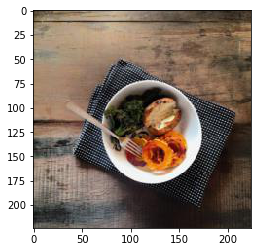

1601


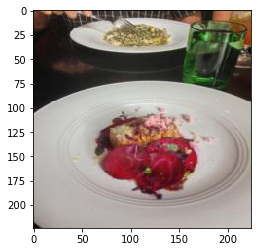

1753


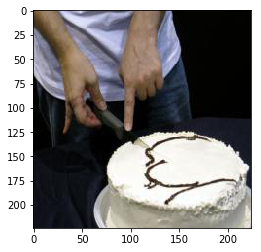

956


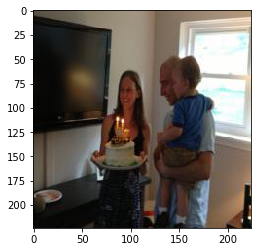

201


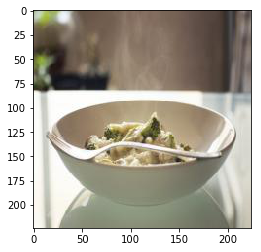

1489


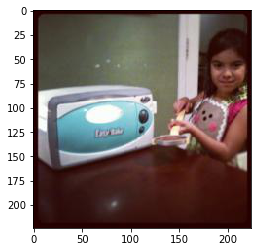

1824


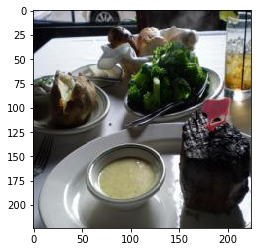

1172


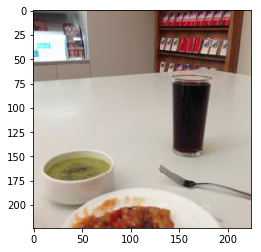

1999


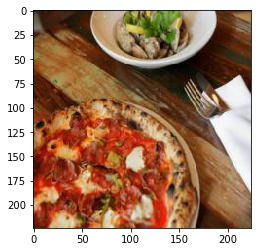

1494


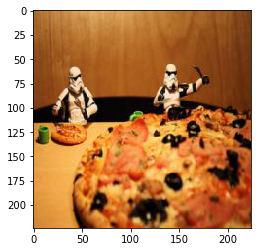

150


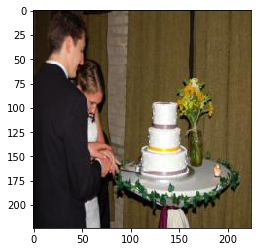

820


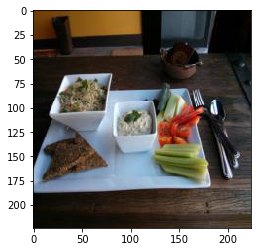

In [98]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
indexImages = f(getImagesSVM[1], 20)
#print indexImages
for i in indexImages:
    print(str(i))
    img = Image.open('./data/images_test/'+ str(i) +'.jpg')
    img = np.asarray(img)
    plt.imshow(img)
    plt.show()

In [95]:
print(type(X))
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

start_time = timeit.default_timer()

classAdaBoost = OneVsRestClassifier(AdaBoostClassifier(DecisionTreeClassifier(max_depth=1),n_estimators=100))
classAdaBoost.fit(X, x_tags)
AdaBoostOutput = classAdaBoost.predict(X_test)
getImagesAdaBoost = cosine_similarity(AdaBoostOutput,x_test_tags)

elapsed = timeit.default_timer() - start_time
print('Time Elapsed (min): '+str(elapsed/60))

<class 'scipy.sparse.csr.csr_matrix'>
Time Elapsed (min): 2.9087945320301363


In [47]:
## CROSS VALIDATION - ADABOOST
from sklearn.model_selection import cross_val_score
scoresAdaB = cross_val_score(classAdaBoost, X, x_tags, cv=3)
print("Accuracy: %0.2f (+/- %0.2f)" % (scoresAdaB.mean(), scoresAdaB.std() * 2))

KeyboardInterrupt: 

810


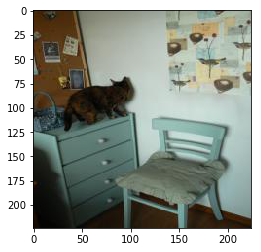

164


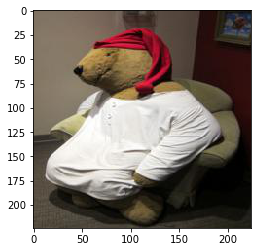

400


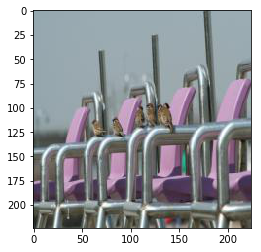

1481


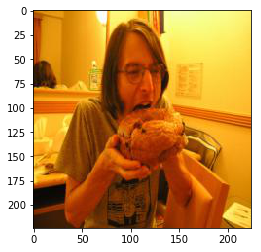

453


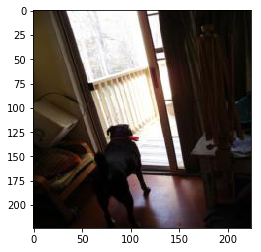

196


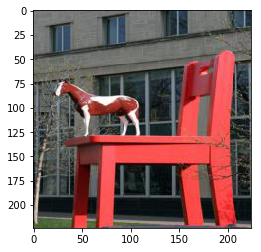

1509


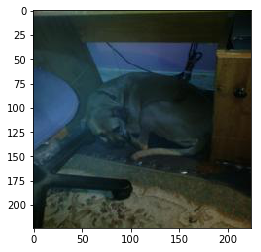

1374


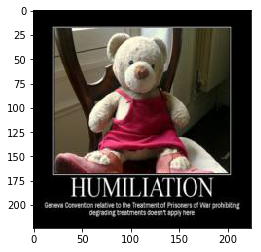

352


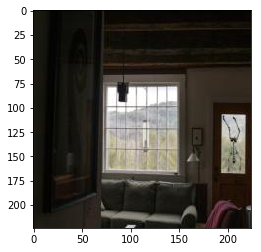

1255


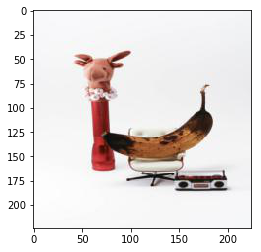

1546


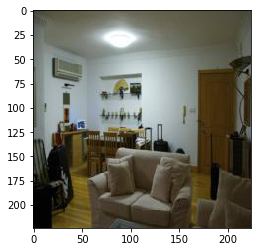

580


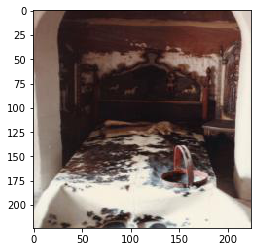

133


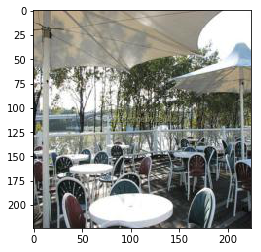

957


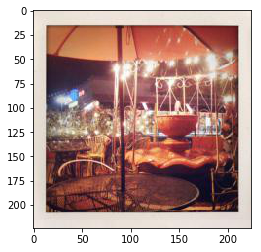

1071


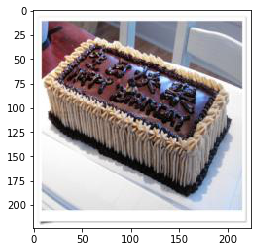

1462


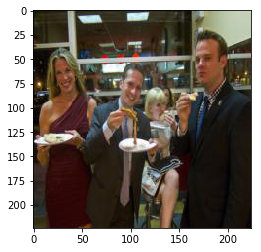

299


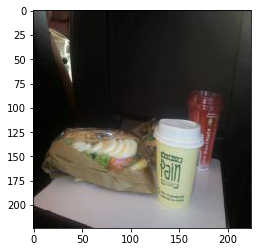

1868


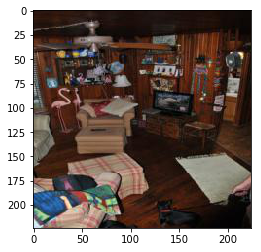

80


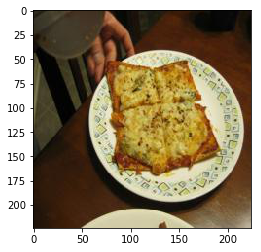

341


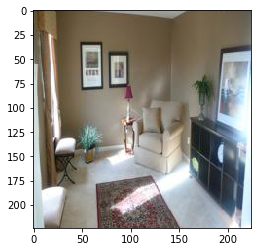

In [25]:
from PIL import Image
import matplotlib.pyplot as plt
indexImages = f(getImagesLDA[1], 20)
for i in indexImages:
    print(str(i))
    img = Image.open('./data/images_test/'+ str(i) +'.jpg')
    img = np.asarray(img)
    plt.imshow(img)
    plt.show()

589


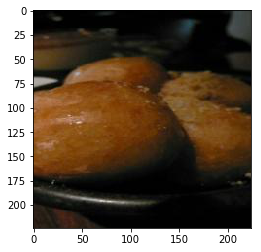

833


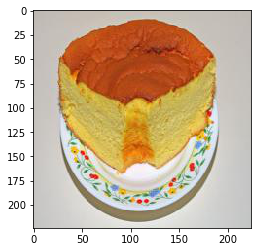

1071


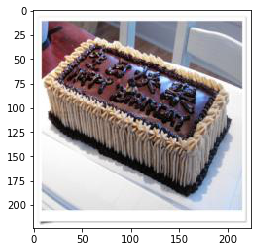

1907


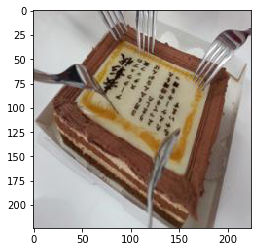

956


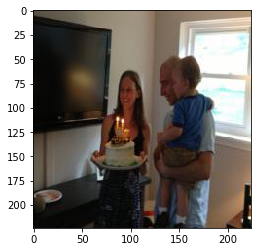

1489


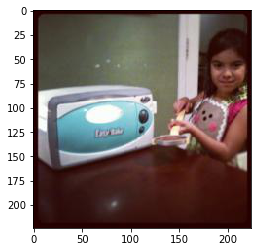

1753


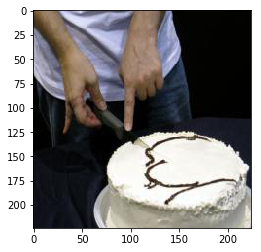

1757


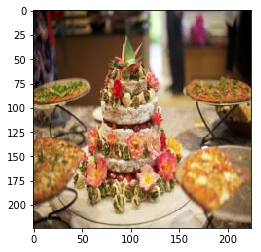

150


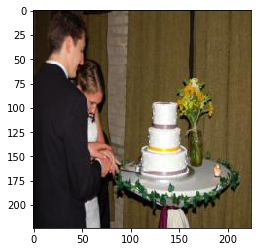

562


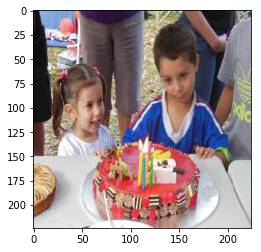

1742


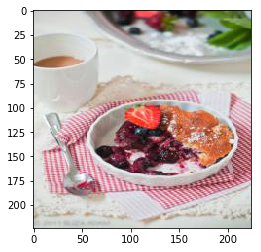

869


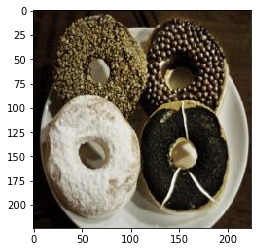

611


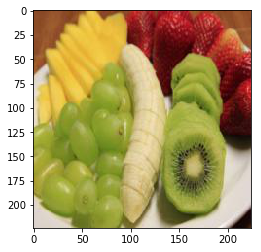

171


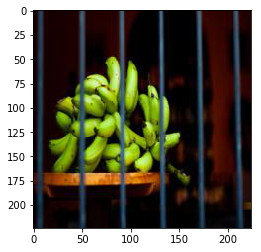

1741


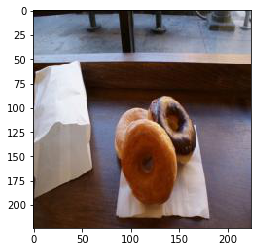

1714


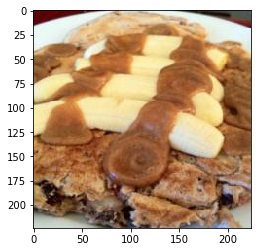

1143


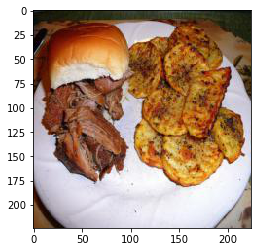

1219


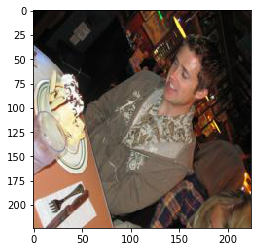

1411


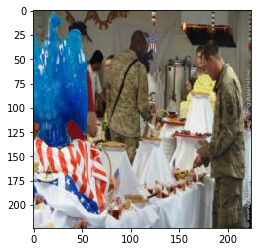

1828


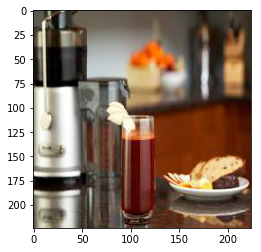

In [96]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
indexImages = f(getImagesAdaBoost[1], 20)
#print indexImages
for i in indexImages:
    print(str(i))
    img = Image.open('./data/images_test/'+ str(i) +'.jpg')
    img = np.asarray(img)
    plt.imshow(img)
    plt.show()

1907


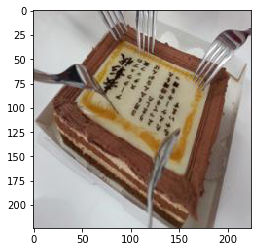

589


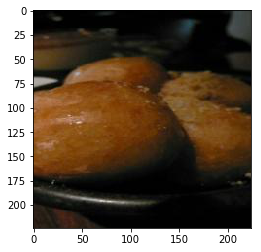

833


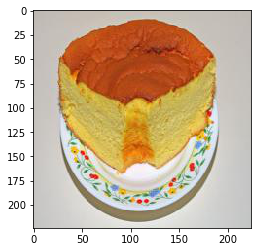

1071


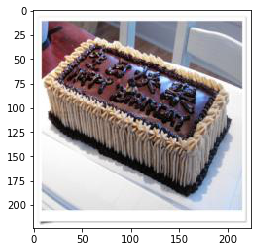

1753


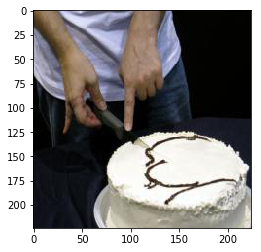

956


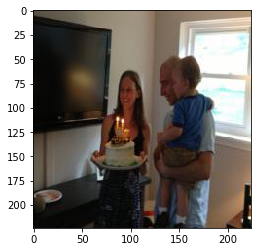

1489


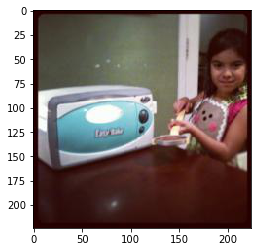

1219


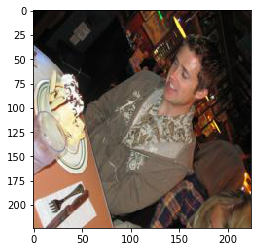

348


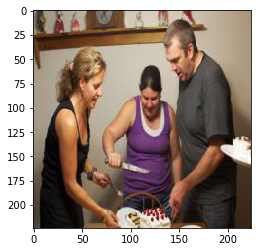

150


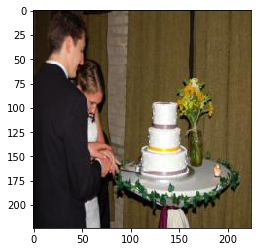

1742


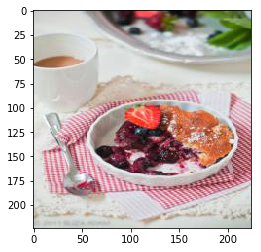

758


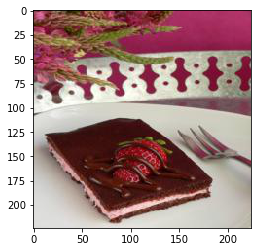

562


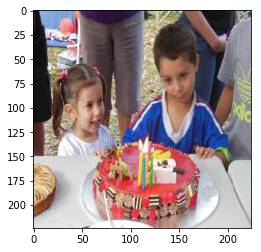

1757


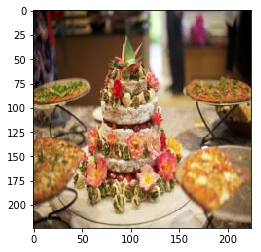

1529


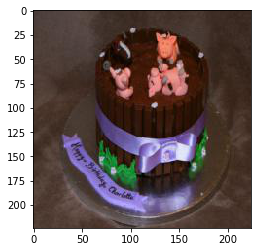

1156


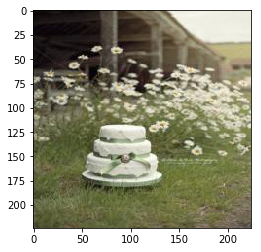

1341


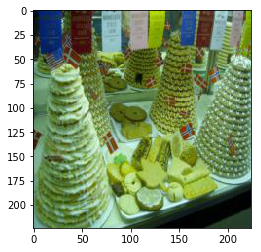

314


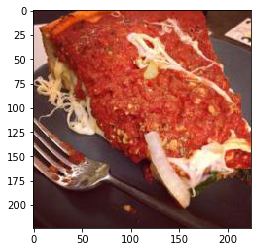

1824


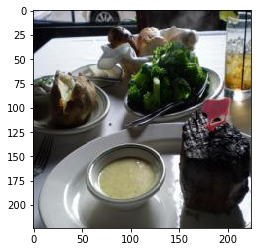

1174


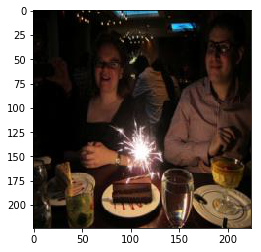

In [116]:
getImagesMean= (getImagesAdaBoost*0.4+getImagesSVM*0.3+getImagesKNN*0.1+getImagesRF*0.2)
indexImages = f(getImagesMean[1], 20)
for i in indexImages:
    print(str(i))
    img = Image.open('./data/images_test/'+ str(i) +'.jpg')
    img = np.asarray(img)
    plt.imshow(img)
    plt.show()

In [117]:
#print(f(getImages[3], 20))
def writeFile(path):
    testdescript=[]
    testoutput=[]
    for i in range(0,2000):
        indexImages = f(getImagesMean[i], 20)
        print(indexImages);
        fname= str(i) + '.txt';
        testdescript.append(fname)
        top=''
        fname=''
        for j in range(len(indexImages)):
            imgnum=indexImages[j]
            fname=str(imgnum)+'.jpg'
            temp=fname+' '
            top+=temp
        testoutput.append(top)
    testdescript=np.array(testdescript)
    testoutput=np.array(testoutput)
    output=np.vstack((testdescript,testoutput))
    output=np.transpose(output)
    return output

In [118]:
output=writeFile("./data/descriptions_test/*.txt")
np.savetxt('outputMeanCos2.csv',output, delimiter=',', fmt='%s')

[ 124 1698 1862 1479   36 1743  942  292 1131 1231  359  255 1816  594   50
 1258  949 1092 1117 1105]
[1907  589  833 1071 1753  956 1489 1219  348  150 1742  758  562 1757 1529
 1156 1341  314 1824 1174]
[1124  445  184  649 1724 1665 1866 1840 1713  953  159  720 1955 1107  598
  327 1089  283    3 1242]
[ 836  799  397  654 1922 1486   75  800 1513 1035 1865 1609 1514  390  469
  930 1716 1121  872  152]
[1862 1698  124 1479  292  942 1743 1231 1131  359   36  255  949 1117 1105
  594 1026 1480   50  484]
[1968 1888  274   51  703   46  887 1287 1696 1693 1830 1322 1895  814 1335
  492  771 1426  614  699]
[ 486  655  555 1320 1289 1855 1275 1265 1216 1815 1885  712  718 1153 1151
 1122  535  156   33  402]
[1949  975 1660 1218  152 1535 1429  897  141 1135  987 1961 1328 1249  756
  481 1155  528 1900 1488]
[1622  134 1948  719  419 1346  266 1557 1397 1847 1817 1261 1918  837  245
  823  103 1901 1031  923]
[  46 1895  814 1322 1696 1761 1045 1426 1693  354 1287  334  330   51 13

  940 1695  497  260  114]
[ 674  191 1369   80 1516  789  368  529  967 1192 1381  139 1628 1201  702
  811 1034 1075 1615 1601]
[1863  470  963 1951  746 1578  713  988  658 1730    9  622  810 1252 1257
 1160  276 1549  242 1978]
[ 472  955  477  241  277 1583 1766  558 1747  664 1604 1947 1244  551 1829
  195 1544 1946  403  581]
[ 110  999  717 1040 1013  891  430  516  602  971  222 1269 1542 1668 1227
  723 1980 1409  575 1523]
[ 993  408  332  625  915 1651 1661  790 1060  755 1493   97 1909 1464  545
  254 1405 1225   43  990]
[1709 1785 1226   61 1835 1230 1723 1199  179 1334 1524  527  261  631 1733
 1673 1934  774  682 1006]
[  78  172  825   26 1404  267 1802  514 1132 1727 1145  989 1492   94 1207
 1215 1903 1517  471 1889]
[1001 1563 1537  692 1869 1079  694  513 1300    0 1100 1324 1881 1796 1983
 1975 1238  383 1276 1718]
[ 685 1488  168 1270  528 1328 1694 1249 1155  987 1085 1961  481  627 1285
 1900  689  756  448  409]
[ 196 1932 1220   90  417   66  686 1130  397 

[  60 1214 1887 1468  752 1613  455 1719 1712  376  220 1093 1634  937 1427
  941 1234  704 1310  652]
[1448 1469  494  213 1775  560  932 1123 1832  384 1362 1363   54 1534 1056
  577  886 1290  183 1190]
[1968 1830 1322  274  771  334 1045 1287 1888 1895  554  330   51  814  699
  526  703   46 1118  887]
[ 324  780  795  454  759  733  467 1058  854 1899 1148  491 1169  501 1994
 1545 1586  894  707  706]
[ 239  944  677  320 1953 1279 1450 1125  779  479 1528   59  807 1002  661
  432  764  650  605 1530]
[1502 1589 1995 1560 1660  897 1135  152 1535 1218  141 1429  653 1430  926
 1200  729 1342  143  146]
[1753  150  348  956  687 1489  435  948  608 1071 1219 1757  265  562  601
  833  589   80 1726  199]
[1135 1218  152  897 1429 1535 1660  141 1179  864  420   47  848 1690  328
 1706  521  669  982  866]
[ 640  170  176 1431  585  500  433 1326 1941 1981 1714  611  171 1116 1174
 1692 1559 1017 1395 1596]
[ 126 1136 1466  736 1280 1535  141 1660  897 1135 1429 1218  152  438  9

[  72 1189  933  413 1288  212  190 1552 1301  344  693 1831  207 1345 1620
  275 1358 1152 1357  750]
[1491  143 1319  624  792 1329 1841 1157  954  146 1763  798  335 1860  240
 1095 1251  410 1502 1905]
[ 986   85  802 1767 1541  148  258  325 1511 1930 1571 1632  618  474 1996
   71  234 1997  188 1686]
[ 669  221 1644  982  866 1787 1499  696 1834  844  459 1327 1365   98 1567
  377 1387  969 1706  848]
[1535 1429  152 1135  897 1218  141 1660  559   63  646  892  761  690 1917
  871  546 1230 1499  696]
[1940 1470 1377  667 1096  583  623 1153  555  535 1768 1275 1758  489  486
 1020   33 1465 1458  156]
[ 782  193  105 1061   34  104  635 1075 1447 1142 1843  178  608  167  100
  957  133 1071 1770 1548]
[ 223   19  785 1051 1176 1902 1461 1149  656 1368  188 1133 1185  338 1081
 1536 1425  340  337  240]
[1633 1725 1036 1406 1520  512 1074  522  101  684 1722 1217 1974 1115 1454
 1681 1568 1400   28  906]
[ 131 1202 1838 1266  293   58 1638  657 1407 1856  252 1384   44  181 16

  857 1905  410  240 1686]
[1188  672 1670  580 1299    4 1129  488   18  423  517  548 1587 1986 1593
  722 1537 1563 1001  692]
[ 182 1194  215  144  741  788  422 1006  682 1435  411 1692 1347 1740 1173
 1090  753 1507 1688 1810]
[ 324  780  795  454  759  733  467 1058  854 1899 1148  491 1169  501 1994
 1545 1586  894  707  706]
[1805 1854 1241 1294  578  827  952  499  707  385  129 1019  706 1256 1845
 1780 1873 1422 1007 1490]
[1772 1022  415   91 1223 1302  409 1270  627 1285 1694 1961 1249  448  987
  481 1239  136  756  528]
[ 194  128  440   87 1364  269  777 1936 1984 1416  273  151 1297  518  214
 1012  853 1082  708   64]
[ 755   97  545  790 1405  332 1493 1661 1464  303  229   43 1225  625 1909
  662  228 1060  272  408]
[1817 1918 1847 1261  531  727  406 1389  913 1222  390 1037  339  451 1525
   92 1660 1535  141  897]
[ 485  615 1983 1238  233  383 1276 1718 1975   41  543 1566 1652   58 1129
  575  595  808 1587 1986]
[ 215 1194  422  182  595 1560 1477  788  741 